In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
os.chdir('/data/lola/shockle/data_for_paper_attempt2/no_pymc')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_mtdreamzs_3chain_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_mtdreamzs_3chain_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_mtdreamzs_3chain_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_mtdreamzs_3chain_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-1082240.03190792]
 [-1082240.03190792]
 [-1082240.03190792]
 ..., 
 [   -4927.44604107]
 [   -4927.44604107]
 [   -4927.44604107]]
Logp of trace:  a  chain:  1  =  [-4927.71936114]
Logp of trace:  a  chain:  2  =  [-4922.0209667]
Logp of trace:  b  chain: 0 =  [[-785484.22415029]
 [-785484.22415029]
 [-785484.22415029]
 ..., 
 [  -4929.6469719 ]
 [  -4929.6469719 ]
 [  -4928.1611547 ]]
Logp of trace:  b  chain:  1  =  [-2525.17229658]
Logp of trace:  b  chain:  2  =  [-4733.3206541]
Logp of trace:  c  chain: 0 =  [[-945416.06000015]
 [-945416.06000015]
 [-945416.06000015]
 ..., 
 [  -4764.9475001 ]
 [  -4764.9475001 ]
 [  -4764.9475001 ]]
Logp of trace:  c  chain:  1  =  [-4874.86906892]
Logp of trace:  c  chain:  2  =  [-4963.62674041]
Logp of trace:  d  chain: 0 =  [[-797411.13555316]
 [-797411.13555316]
 [-797411.13555316]
 ..., 
 [  -4930.20424132]
 [  -4930.20424132]
 [  -4930.20424132]]
Logp of trace:  d  chain:  1  =  [-4976.25211608]
Logp of tr

In [5]:
from earm_exp_parameters import earm_rates
uni_idx = []
norm_idx = []
uni_n = 0
norm_n = 0
for i, param in enumerate(model.parameters_rules()):
    if earm_rates[param.name]['type'] == 'uniform':
        uni_idx.append(i)
        uni_n += 1
    elif earm_rates[param.name]['type'] == 'normal':
        norm_idx.append(i)
        norm_n += 1

kf mito:  -14.8452186131  -  0.154781386928
kr mito:  -4.15478138693  -  13.8452186131
kf cyto:  -16.0001205731  -  -1.00012057306
kr cyto:  -2.99987942694  -  15.0001205731


In [6]:
traces['b'][0][:,72]

array([-7.35087279, -7.35087279, -7.35087279, ..., -8.4512384 ,
       -8.4512384 , -8.4512384 ])

In [7]:
traces['a'][0][:,72]

array([-8.16564263, -8.16564263, -8.16564263, ..., -7.76275195,
       -7.76275195, -7.76275195])

In [8]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    uni_param_n = 0
    norm_param_n = uni_n
    for i, param in enumerate(model.parameters_rules()):
        if i in uni_idx:
            param_trace_dict_a[param.name] = [traces[run][chain][:,uni_param_n] for chain in range(len(traces[run]))]
            uni_param_n += 1
        else:
            param_trace_dict_a[param.name] = [traces[run][chain][:,norm_param_n] for chain in range(len(traces[run]))]
            norm_param_n += 1
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [9]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  99  of  105  parameters.
Percent of parameters with GR below 1.2:  94.2857142857
Number of parameters with GR below 1.1:  97  of  105  parameters.
Percent of parameters with GR below 1.1:  92.380952381


[99, 94.28571428571428, 97, 92.38095238095238]

In [10]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  73  of  105  parameters.
Percent of parameters with GR below 1.2:  69.5238095238
Number of parameters with GR below 1.1:  47  of  105  parameters.
Percent of parameters with GR below 1.1:  44.7619047619


[73, 69.52380952380952, 47, 44.761904761904766]

In [11]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  93  of  105  parameters.
Percent of parameters with GR below 1.2:  88.5714285714
Number of parameters with GR below 1.1:  88  of  105  parameters.
Percent of parameters with GR below 1.1:  83.8095238095


[93, 88.57142857142857, 88, 83.80952380952381]

In [12]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  92  of  105  parameters.
Percent of parameters with GR below 1.2:  87.619047619
Number of parameters with GR below 1.1:  86  of  105  parameters.
Percent of parameters with GR below 1.1:  81.9047619048


[92, 87.61904761904762, 86, 81.9047619047619]

In [13]:
param_trace_dicts['d']['bind_L_R_to_LR_kf']

[array([-7.71735152, -7.71735152, -7.71735152, ..., -8.70469367,
        -8.70469367, -8.70469367]),
 array([-7.24580086, -7.24580086, -7.24580086, ..., -7.78181665,
        -7.78181665, -7.78181665]),
 array([ -7.24580086,  -7.24580086,  -7.24580086, ..., -10.28598329,
        -10.28598329, -10.28598329])]

60000
3
60000


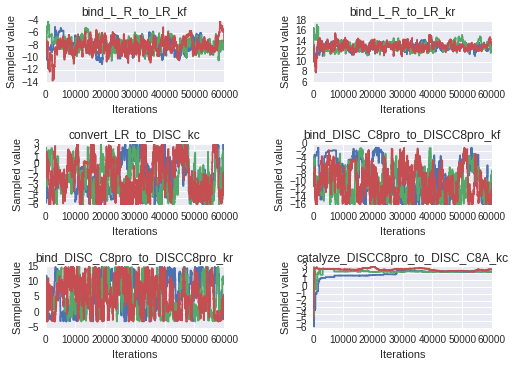

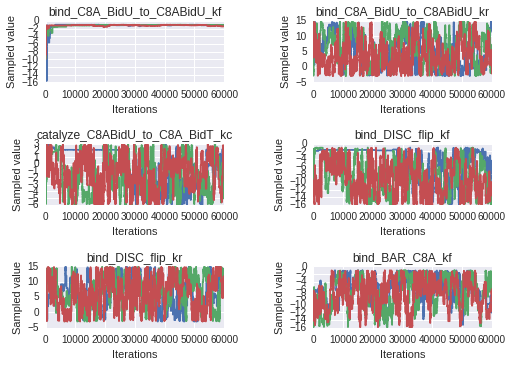

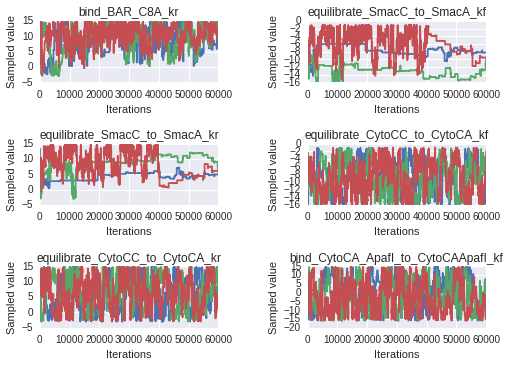

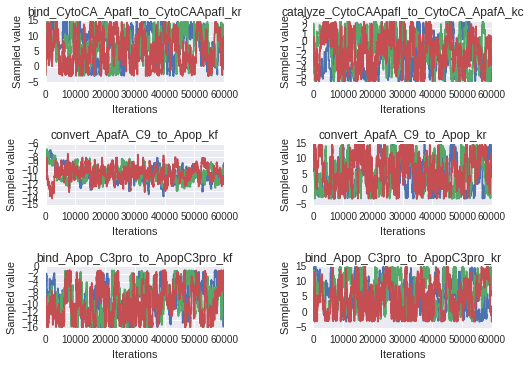

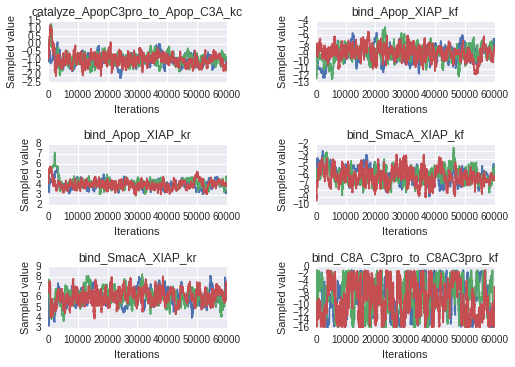

...

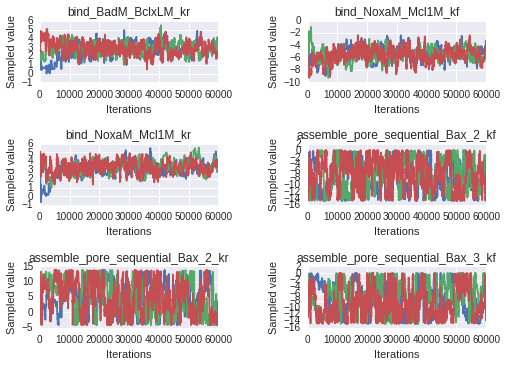

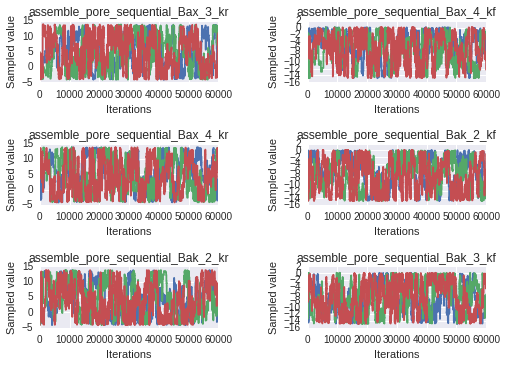

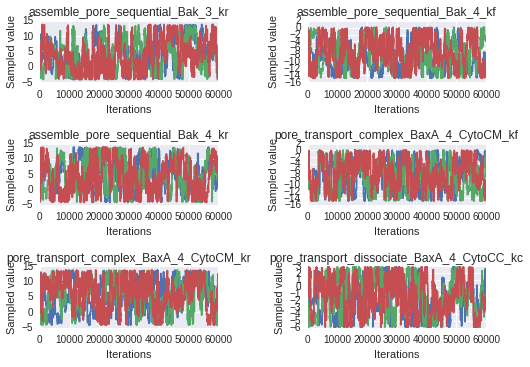

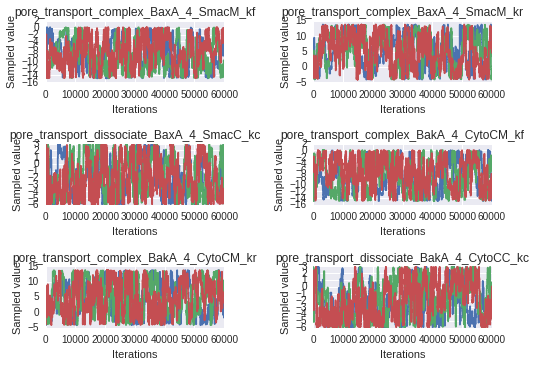

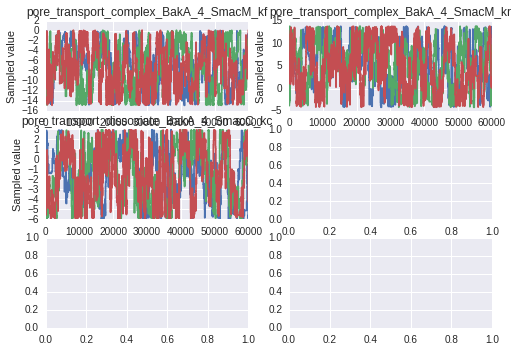

In [14]:
sample_plots(param_trace_dicts['a'])

In [15]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=30000)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=30000)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=30000)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=30000)

/gpfs22/local/centos6/python2/2.7.8/x86_64/gcc46/nonet/lib/python2.7/site-packages/matplotlib-1.5.dev1-py2.7-linux-x86_64.egg/matplotlib/pyplot.py:423: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


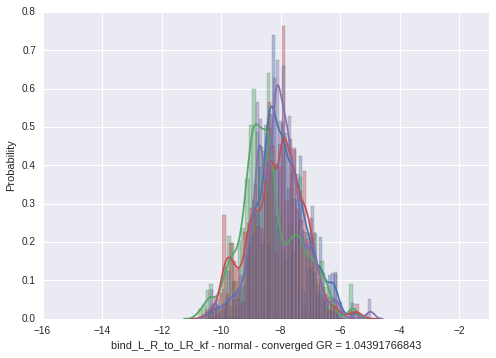

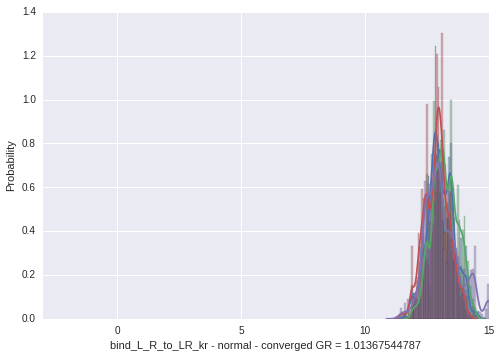

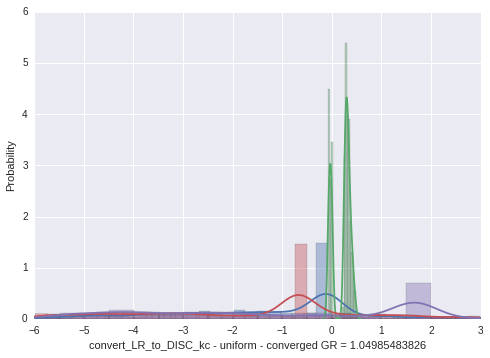

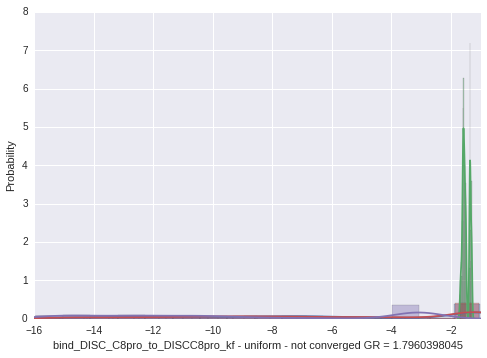

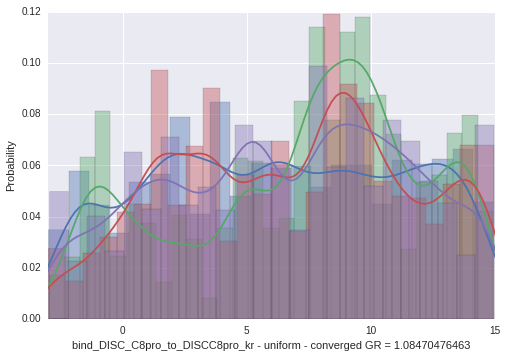

...

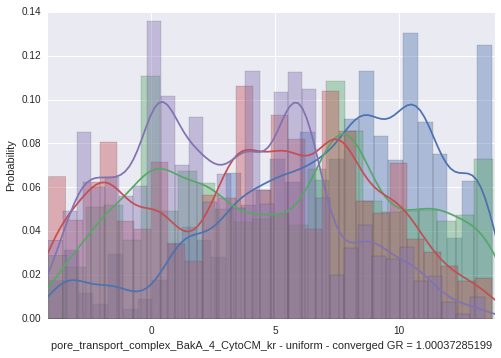

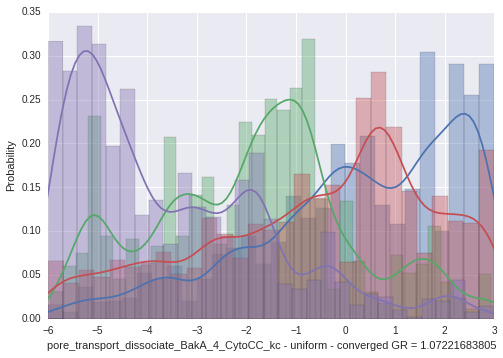

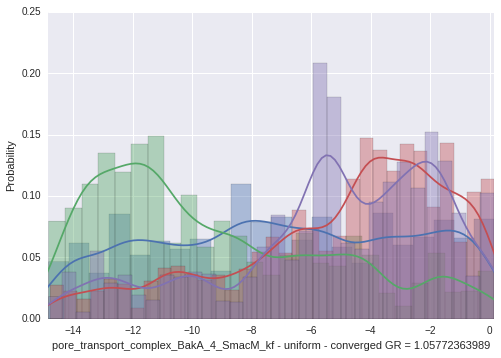

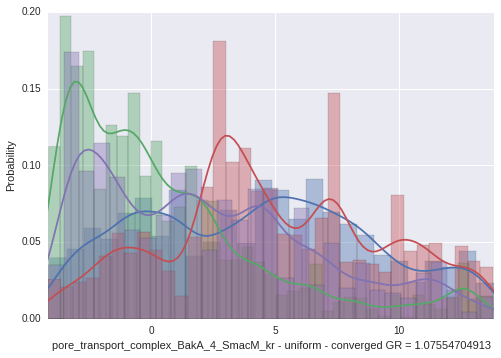

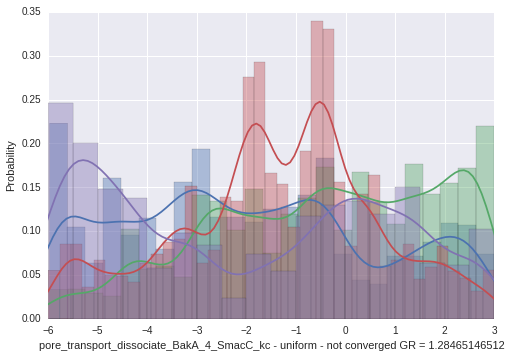

In [16]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True)
    sns.distplot(trace_arr_b[:,dim], hist=True)
    sns.distplot(trace_arr_c[:,dim], hist=True)
    sns.distplot(trace_arr_d[:,dim], hist=True)
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - '+earm_rates[param_name]['type']+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - '+earm_rates[param_name]['type']+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    if earm_rates[param_name]['type'] == 'uniform':
        ax.set_xlim([earm_rates[param_name]['lower'], earm_rates[param_name]['upper']])
    elif 'kf' in param_name:
        ax.set_xlim([-16, -1])
    elif 'kr' in param_name:
        ax.set_xlim([-3, 15])
    elif 'kc' in param_name:
        ax.set_xlim([-6, 3])

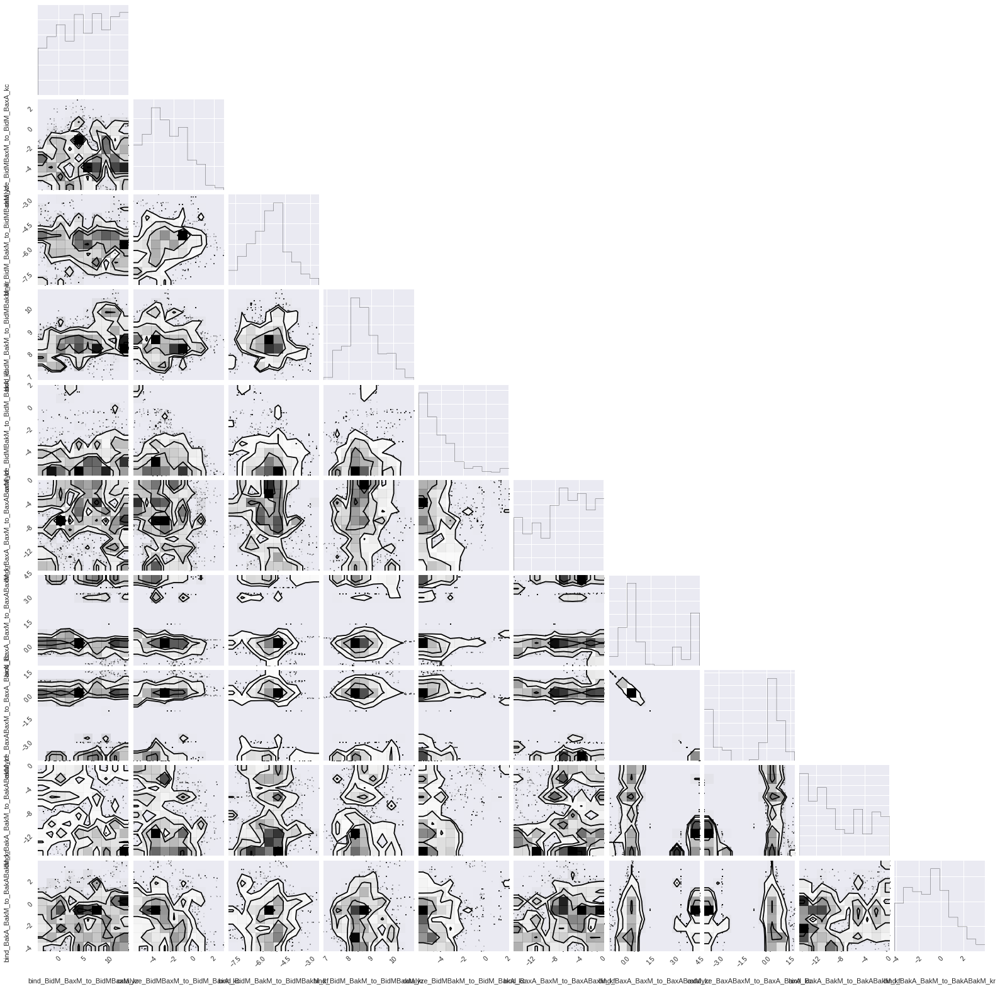

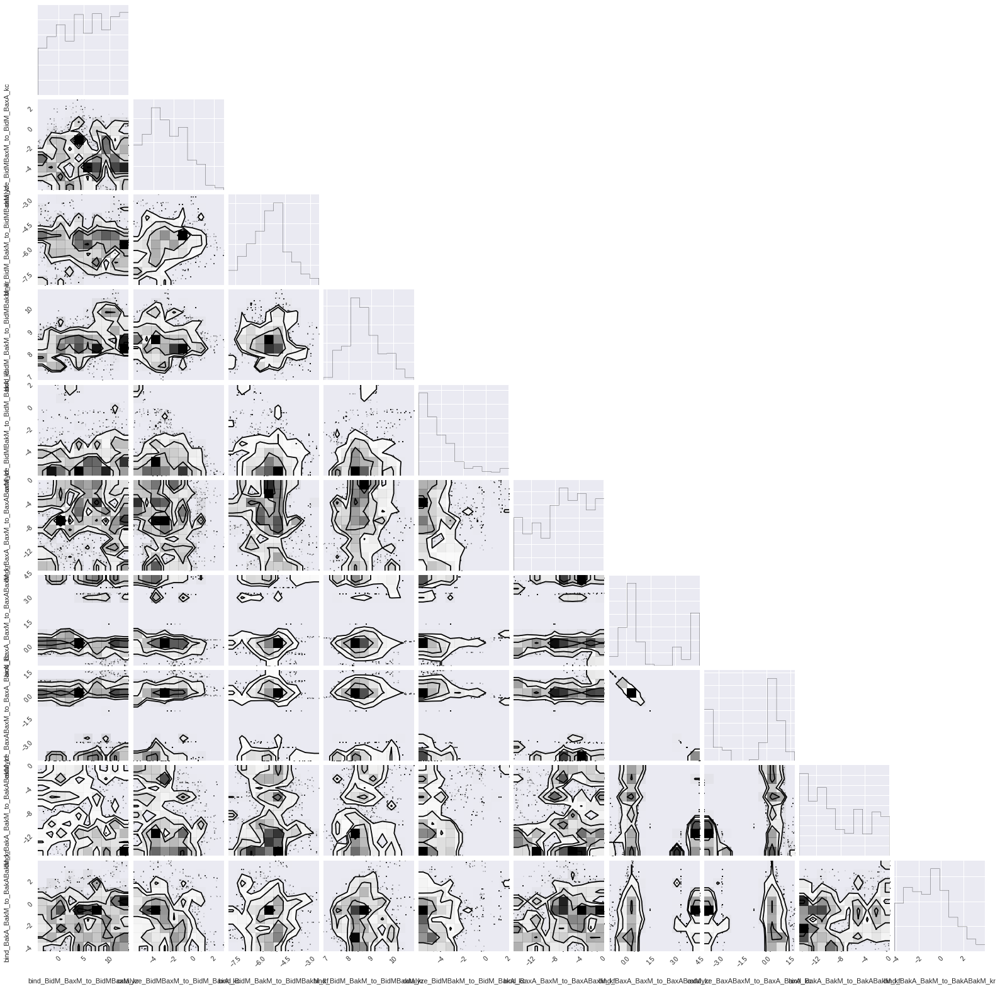

In [17]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)